
38-Cloud è un dataset di immagini satellitari etichettate per la segmentazione delle nuvole. Il dataset è composto da 38 immagini Landsat 8 acquisite in diverse località del Nord America. Le immagini satellitari di 38-Cloud sono state ritagliate in tanti pezzetti più piccoli chiamati "patch" la cui dimensione è di 384 pixel per 384 pixel,in quanto consente di processare le immagini in modo più efficiente

Il dataset è stato suddiviso in due insiemi: training e testing.
L'insieme di training contiene 8400 patch.
L'insieme di testing contiene 9201 patch. Questi patch vengono utilizzati per valutare le prestazioni degli algoritmi di deep learning addestrati sull'insieme di training.
Ogni patch ha 4 canali spettrali corrispondenti alle bande:
1. Rosso (banda 4)
2. Verde (banda 3)
3. Blu (banda 2)
4. Vicino infrarosso (banda 5)

A differenza di altri dataset di immagini per computer vision, questi canali non sono combinati in un'unica immagine RGB.
Invece, i canali sono salvati in cartelle separate corrispondenti alla banda spettrale.La separazione dei canali spettrali consente agli algoritmi di deep learning di apprendere relazioni più complesse tra le diverse bande. Questo può migliorare la precisione nella segmentazione delle nuvole rispetto alla combinazione dei canali in un'unica immagine RGB prima del training.

# Kaggle

Inizio istallando Kaggle

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets  download sorour/38cloud-cloud-segmentation-in-satellite-images
! unzip 38cloud-cloud-segmentation-in-satellite-images.zip

Output streaming troncato alle ultime 5000 righe.
  inflating: 38-Cloud_training/train_red/red_patch_271_12_by_7_LC08_L1TP_011002_20160620_20170323_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_19_LC08_L1TP_011247_20160620_20170323_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_19_LC08_L1TP_029040_20160720_20170222_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_19_LC08_L1TP_032029_20160420_20170223_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_19_LC08_L1TP_034034_20160520_20170223_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_19_LC08_L1TP_045026_20160720_20170221_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_19_LC08_L1TP_047023_20160920_20170221_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_7_LC08_L1TP_061017_20160720_20170223_01_T1.TIF  
  inflating: 38-Cloud_training/train_red/red_patch_271_13_by_7_L

# Utili

In [ ]:
import numpy as np
import warnings
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import torch.utils.data as data
import torchvision
import torchvision.transforms.functional as TF
from torchvision import datasets, models, transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score
from torch.utils.data import DataLoader
import torch.nn.functional as F
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import random
import cv2
import random
import csv
import seaborn as sns
import albumentations as A
import gc

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [ ]:
def set_seed(seed):
  random.seed(seed)
  np.random.seed(seed)
  torch.manual_seed(seed)
  torch.cuda.manual_seed_all(seed)
set_seed(42)

utile per la visualizzazione

* batch_to_img-> Estrae l'immagine
all'indice specificato, preleva i 3 canali (RGB) e li trasforma in NumPy array e sistema le dimensioni

* predb_to_mask->Applica una funzione softmax alle predizioni per l'immagine selezionata per normalizzare le probabilità tra le classi e seleziona la probabilità maggiore grazie a argmax(0)

In [ ]:
def batch_to_img(xb, idx):
    img = np.array(xb[idx,0:3])
    return img.transpose((1,2,0))

def predb_to_mask(predb, idx):
    p = torch.functional.F.softmax(predb[idx], 0)
    return p.argmax(0).cpu()

# CODICE

## DataSet

Definisco combine, che mi serve per creare un dizionario files. Il concetto è che unisco le immagini riferite alla stessa immagine dei 4 canali piu la gt (vedo i percorsi)

In [ ]:
def combine(r_file: Path, g, b, nir, gt):
        # Combina i percorsi dei file delle diverse bande in un dizionario
        #il percorso r_file è come la base per crere il dizionario e
        #per gli altri uso come base il nome del percorso rosso dove vado a cambaire
        #"red" con la banda di interesse
        files = {'red': r_file,
                 'green':g/r_file.name.replace('red', 'green'),
                 'blue': b/r_file.name.replace('red', 'blue'),
                 'nir': nir/r_file.name.replace('red', 'nir'),
                 'gt': gt/r_file.name.replace('red', 'gt')}

        return files

In [ ]:
base_path = Path('38-Cloud_training')
r=base_path/'train_red'
g=base_path/'train_green'
b=base_path/'train_blue'
nir=base_path/'train_nir'
gt=base_path/'train_gt'
files = [combine(f, g, b, nir, gt) for f in r.iterdir() if not f.is_dir()]

A questo punto una volta creato files, creo la CloudDataset. Già al suo interno c'è la trasforamzione in tensori utile per pytorch. Ho anche implementato *calc_mean_std* utile per il calcolo del mean e std che poi uso per normalizzare

In [ ]:
class CloudDataset1(torch.utils.data.Dataset):
    def __init__(self, files, transform=False, trasformN=None, pytorch=True):
        super().__init__()
        self.files = files
        self.b=transform

        if(self.b==True):
          self.transformazzione = get_train_augmentations()

        self.trasformN=trasformN
        self.pytorch=pytorch

    def __len__(self):
        # Restituisce la lunghezza del dataset(numero dei file)
        return len(self.files)


    def open_as_array(self, idx, invert=False, include=False):
        # Apre le immagini in posizione idx e le converto in un array NumPy utile per PyTorch

        # Carica le bande RGB
        rgb = np.stack([np.array(Image.open(self.files[idx]['red'])),
                            np.array(Image.open(self.files[idx]['green'])),
                            np.array(Image.open(self.files[idx]['blue'])),
                           ], axis=2) #axis 2 indica di impilare lungo la terza dim dell'array
        # il nostro rgb dovrebbe ora essere un array con 3 dimensioni di cui le prime due sono h e w e l'ultima rapprensenza
        # il numero di canali in questo caso 3 (non c'è nir)

        # Aggiunge la banda NIR all'array se richiesto (ora avrei 4 canali)
        if include:
            nir = np.expand_dims(np.array(Image.open(self.files[idx]['nir'])), 2)
            rgb = np.concatenate([rgb, nir], axis=2)

        #inverte gli assi dell'array per renderlo compatibile con la convenzione PyTorch (canali prima di altezza e larghezza)
        if invert:
            rgb = rgb.transpose((2,0,1))

        # Normalizza i valori dell'array ho dovuto fare questo passaggio perchè avevo problemi con i valori e
        # cercando informazioni online questa risulta la cosa migliore per normalizzare i dati dividendoli per il più
        #alto valore possibile dell'array portando l'immagine tra 0 e 1
        return rgb / np.iinfo(rgb.dtype).max


    def open_mask(self, idx, add_dims=False):
        # Apre le maschere come array numpy

        # Carica la maschera e Converte i pixel con valore 255 in 1 e gli altri in 0
        #ovvero  1 ai pixel corrispondenti alle nuvole e 0 altrimenti
        mask = np.array(Image.open(self.files[idx]['gt']))
        mask = np.where(mask==255, 1, 0)

        # Aggiunge le dimensioni all'array se richiesto
        return np.expand_dims(mask, 0) if add_dims else mask

    def calc_mean_std(self, dataset):

       # Inizializza le variabili per accumulare le statistiche
      mean = torch.zeros(4)
      std = torch.zeros(4)

      # Itera su ogni batch di immagini
      for i in range(len(dataset)):
        images, _ = self[i]

         # Converte l'array NumPy in un tensore PyTorch
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            images_tensor = torch.tensor(images)

        # Calcola la media e la deviazione standard del batch
        #dim->indica che si vuole calcolare la media lungo le prime tre dimensioni del tensore.
        #il tensore contiene la media di tutti i valori in ogni canale per tutte le immagini nel batch. Per ogni canale c il valore in posizione c del tensore batch_mean è la media di tutti i valori nel canale c in tutte le immagini del batch.
        batch_mean = torch.mean(images_tensor, dim=(0, 1, 2)) #h, w, batch
        batch_std = torch.std(images_tensor, dim=(0, 1, 2))

        # Accumula le statistiche per ogni canale
        mean += batch_mean
        std += batch_std


      # Calcola la media e la deviazione standard finali
      mean /= len(self)
      std /= len(self)

      return mean, std


    def count_black_images(self):
        # Conta quante immagini sono completamente nere
        black_count = 0
        for i in range(len(self)):
            image = self.open_as_array(i, invert=True, include=True)
            if np.all(image == 0):
                black_count += 1
        return black_count


    def elimina_black(self, num_to_remove=None):
        non_black_files = []
        black_files = []

        for i in range(len(self.files)):
            image = self.open_as_array(i, invert=True, include=True)
            if np.all(image == 0):
                black_files.append(self.files[i])
            else:
                non_black_files.append(self.files[i])

        # Stampa debug prima di eliminare
        print(f"Numero di immagini nere prima: {len(black_files)}")
        print(f"Numero di immagini non nere prima: {len(non_black_files)}")

        if num_to_remove is not None and num_to_remove < len(black_files):
            black_files = black_files[num_to_remove:]
        else:
            black_files = []

        # Aggiorna self.files con le immagini non nere e le rimanenti immagini nere
        self.files = non_black_files + black_files

        # Stampa debug dopo l'eliminazione
        print(f"Numero di immagini nere dopo: {len(black_files)}")
        print(f"Numero di immagini non nere dopo: {len(non_black_files)}")



    def __getitem__(self, idx):

      x = self.open_as_array(idx, invert=self.pytorch, include=True)

      y = self.open_mask(idx, add_dims=False)

      if(self.b==True):
        im=x.transpose(1,2,0)
        augm=self.transformazzione(image =im, mask =y)
        x=augm["image"].transpose(2,0,1)
        y=augm["mask"]


      x = torch.tensor(x, dtype=torch.float32)  # Cambiato a torch.float32


      y = torch.tensor(y, dtype=torch.int64)  # Nessun cambiamento qui


      if self.trasformN is not None:
        x=self.trasformN(x)

      return x, y


    def get_black_image_indices(self):
        black_indices = []
        for i in range(len(self)):
            image = self.open_as_array(i, invert=True, include=True)
            if np.all(image == 0):
                black_indices.append(i)
        return black_indices


    def __repr__(self):
        # Rappresentazione testuale della classe
        s = 'Dataset class with {} files'.format(self.__len__())

        return s

## Prova per eliminare le immagini nere

In [ ]:
train=CloudDataset1(files)

In [ ]:
im_ner=train.count_black_images()
print(im_ner)

2813


In [ ]:
black_image_indices = train.get_black_image_indices()
print(f'Indici delle immagini nere: {black_image_indices}')

Indici delle immagini nere: [2, 7, 9, 12, 13, 18, 19, 21, 23, 28, 31, 33, 37, 38, 40, 41, 42, 48, 50, 53, 55, 56, 58, 59, 60, 61, 62, 65, 76, 77, 82, 83, 87, 88, 89, 90, 91, 96, 97, 98, 100, 101, 106, 112, 113, 114, 116, 118, 119, 121, 123, 124, 125, 130, 131, 132, 133, 140, 142, 144, 146, 149, 152, 154, 155, 156, 158, 162, 166, 167, 170, 176, 179, 183, 184, 187, 188, 190, 194, 196, 197, 201, 212, 214, 220, 221, 222, 224, 226, 228, 231, 237, 241, 245, 248, 251, 253, 254, 256, 258, 262, 264, 268, 269, 274, 278, 280, 282, 283, 287, 288, 291, 294, 295, 298, 299, 301, 304, 306, 308, 315, 321, 325, 328, 335, 337, 340, 341, 342, 345, 351, 352, 360, 374, 376, 377, 379, 380, 384, 385, 389, 396, 398, 403, 406, 407, 412, 414, 416, 417, 418, 423, 429, 432, 433, 440, 441, 443, 444, 448, 449, 451, 452, 459, 462, 465, 466, 469, 472, 473, 474, 477, 479, 481, 483, 485, 491, 492, 493, 495, 501, 504, 514, 516, 519, 521, 522, 526, 527, 528, 544, 546, 548, 553, 557, 558, 559, 562, 563, 567, 569, 570, 573,

In [ ]:
train.elimina_black()

Numero di immagini nere prima: 2813
Numero di immagini non nere prima: 5587
Numero di immagini nere dopo: 0
Numero di immagini non nere dopo: 5587


In [ ]:
print(len(train.files))

5587


### per salvare sul drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
root="/content/drive/MyDrive/Tesi/"

In [ ]:
torch.save(train.files, root+'flies')

In [ ]:
files1=torch.load(root+"files")

## Creazione val e train set

con il train_file realizzo data e faccio:
1. delle stampe delle dimensioni
2. calcolo mean e std per normalizzare
3. realizzo una transforms.Compose al momento uguale sia per training che validation
4. rifaccio la normalizzazione sul train e verifico che ha funzionato
5. realizzo la validation_set e faccio le stesse cose fatte per il train_set

In [ ]:
import os
os.chdir('/content')

In [ ]:
train_file, val_file = train_test_split(files1, test_size=0.2, random_state=42)

In [ ]:
torch.save(train_file, root+'train_file')
torch.save(val_file, root+'val_file')

In [ ]:
train_file=torch.load(root+'train_file')
val_file=torch.load(root+'val_file')

In [ ]:
dati=CloudDataset1(train_file)

In [ ]:
print(len(dati))
x, y = dati[10]
print(x.shape, y.shape)
print(x)


4469
torch.Size([4, 384, 384]) torch.Size([384, 384])
tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1279, 0.1243, 0.1230,  ..., 0.0949, 0.0947, 0.0940],
         [0.1252, 0.1200, 0.1165,  ..., 0.0945, 0.0947, 0.0939],
         [0.1292, 0.1268, 0.1187,  ..., 0.0942, 0.0950, 0.0942]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1368, 0.1348, 0.1345,  ..., 0.1074, 0.1074, 0.1066],
         [0.1344, 0.1308, 0.1298,  ..., 0.1071, 0.1067, 0.1059],
         [0.1372, 0.1360, 0.1313,  ..., 0.1067, 0.1064, 0.1058]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
    

In [ ]:
data_mean, data_std = dati.calc_mean_std(dati)
print("Mean:", data_mean)
print("Std:", data_std)

Mean: tensor([0.2330, 0.2330, 0.2330, 0.2330])
Std: tensor([0.0813, 0.0813, 0.0813, 0.0813])


In [ ]:
Nor=transforms.Compose([
    transforms.Normalize(data_mean, data_std)
])

In [ ]:
train_set=CloudDataset1(train_file,transform=False, trasformN=Nor)

In [ ]:
print(len(train_set))
x, y = train_set[10]
print(x.shape, y.shape)
print(x)

4469
torch.Size([4, 384, 384]) torch.Size([384, 384])
tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1279, 0.1243, 0.1230,  ..., 0.0949, 0.0947, 0.0940],
         [0.1252, 0.1200, 0.1165,  ..., 0.0945, 0.0947, 0.0939],
         [0.1292, 0.1268, 0.1187,  ..., 0.0942, 0.0950, 0.0942]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1368, 0.1348, 0.1345,  ..., 0.1074, 0.1074, 0.1066],
         [0.1344, 0.1308, 0.1298,  ..., 0.1071, 0.1067, 0.1059],
         [0.1372, 0.1360, 0.1313,  ..., 0.1067, 0.1064, 0.1058]],

        [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
    

Vedo di nuovo la mean e std e infatti risulta che dopo la normalizzazione mean si avvicina a 0 e std ad 1

In [ ]:
mean_p, std_p = train_set.calc_mean_std(train_set)
print("Mean:", mean_p)
print("Std:", std_p)

Mean: tensor([0.2330, 0.2330, 0.2330, 0.2330])
Std: tensor([0.0813, 0.0813, 0.0813, 0.0813])


In [ ]:
val_set=CloudDataset1(val_file, transform=False, trasformN=Nor)

In [ ]:
print(len(val_set))
x, y = val_set[10]
print(x.shape, y.shape)
print(y)

1118
torch.Size([4, 384, 384]) torch.Size([384, 384])
tensor([[0, 0, 0,  ..., 0, 1, 1],
        [0, 0, 0,  ..., 0, 0, 1],
        [0, 0, 0,  ..., 0, 0, 1],
        ...,
        [1, 1, 0,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])


## Visualizzazioni Immagini del set

Visualizzo 5 immagini random per il validation e per il training set

In [ ]:
indici = random.sample(range(100), 5)

# Crea una figura con 5 subplots
fig, axes = plt.subplots(5, 2, figsize=(15, 25))

# Itera sui 5 indici casuali
for i, idx in enumerate(indici):
    # Carica l'immagine e la maschera delle nuvole
    img = train_set.open_as_array(idx)
    mask = train_set.open_mask(idx)

    # Visualizza l'immagine nel subplot corrispondente
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f'Image {idx}')
    axes[i, 0].axis('off')

    # Visualizza la maschera delle nuvole nel subplot corrispondente
    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f'Mask {idx}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
indici = random.sample(range(100), 5)

# Crea una figura con 5 subplots
fig, axes = plt.subplots(5, 2, figsize=(15, 25))

# Itera sui 5 indici casuali
for i, idx in enumerate(indici):
    # Carica l'immagine e la maschera delle nuvole
    img = val_set.open_as_array(idx)
    mask = val_set.open_mask(idx)

    # Visualizza l'immagine nel subplot corrispondente
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f'Image {idx}')
    axes[i, 0].axis('off')

    # Visualizza la maschera delle nuvole nel subplot corrispondente
    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f'Mask {idx}')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

## Creazione DataLoader e visualizzazione

senza immagine nere sto provando con 16 di batch

In [ ]:
train_loader = data.DataLoader(train_set, batch_size=8, shuffle=True)
val_loader = data.DataLoader(val_set, batch_size=8, shuffle=False)

In [ ]:
indici = random.sample(range(15), 5)
batch = next(iter(train_loader))
images, masks = batch
# Crea una figura con 5 subplots
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
for i, idx in enumerate(indici):
    # Carica l'immagine e la maschera delle nuvole
    img = train_set.open_as_array(idx)
    mask = train_set.open_mask(idx)

    # Visualizza l'immagine nel subplot corrispondente
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f'Image {idx}')
    axes[i, 0].axis('off')

    # Visualizza la maschera delle nuvole nel subplot corrispondente
    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f'Mask {idx}')
    axes[i, 1].axis('off')
plt.show()

In [ ]:
indici = random.sample(range(15), 5)
batch = next(iter(val_loader))
images, masks = batch
# Crea una figura con 5 subplots
fig, axes = plt.subplots(5, 2, figsize=(15, 25))
for i, idx in enumerate(indici):
    # Carica l'immagine e la maschera delle nuvole
    img = train_set.open_as_array(idx)
    mask = train_set.open_mask(idx)

    # Visualizza l'immagine nel subplot corrispondente
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f'Image {idx}')
    axes[i, 0].axis('off')

    # Visualizza la maschera delle nuvole nel subplot corrispondente
    axes[i, 1].imshow(mask)
    axes[i, 1].set_title(f'Mask {idx}')
    axes[i, 1].axis('off')
plt.show()

## U-Net

U-Net è una rete neurale convoluzionale sviluppata presso il Dipartimento di Informatica dell'Università di Friburgo per la segmentazione di immagini biomediche.

**Architettura**
Si compone di un percorso contraente e di un percorso espansivo

1. **Percorso di contrazione**: Questo percorso cattura i contesti dell'immagine. Comprende blocchi di down-sampling che riducono la dimensione spaziale dell'immagine mentre aumentano il numero di canali. In ogni blocco, viene applicata una convoluzione seguita da un'attivazione ReLU e da un pooling massimo.

2. **Percorso di espansione** : Questo percorso ripristina la risoluzione spaziale e localizza le caratteristiche precise. Comprende blocchi di up-sampling che aumentano la dimensione spaziale dell'immagine mentre riducono il numero di canali. In ogni blocco, viene applicata una convoluzione trasposta seguita da un concatenamento con le caratteristiche corrispondenti dal percorso di contrazione, un ritaglio e un'attivazione ReLU.

*  **DoppiaConv**--->definisce un blocco base per U-Net, costituito da due strati convoluzionali 3x3 consecutivi con padding per mantenere le dimensioni spaziali.

      * Uno strato convoluzionale (Conv2D) esegue un'operazione di convoluzione su un'immagine in ingresso. Questa operazione fa scorrere un kernel (filtro) di dimensioni fisse sull'immagine, calcolando un nuovo valore per ogni posizione del kernel. Il valore calcolato è la somma ponderata dei pixel dell'immagine all'interno del kernel, ponderata dai valori del kernel stesso
      *  Questo kernel 3x3 si sposta sull'immagine in ingresso un pixel alla volta (stride=1) senza modificare le dimensioni dell'immagine in uscita (padding=1).
      * nn.BatchNorm2d->Questo strato esegue la normalizzazione di batch sui canali dell'output della convoluzione. La normalizzazione di batch aiuta a stabilizzare l'addestramento della rete e migliorare le prestazioni.
      * nn.ReLU-> La funzione ReLU introduce non linearità nella rete, aiutandola a imparare pattern complessi nei dati.


UNET-> vera e propria rete UNET



In [ ]:
class DoppiaConv(nn.Module):
  def __init__(self, in_channels, out_channels):
    super(DoppiaConv, self).__init__()
    self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels,3,1,1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, 1,1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

  def forward(self,x):
    return self.conv(x)


class UNET(nn.Module):
    def __init__(self, in_channels, out_channels, features=[64, 128, 256, 512]):
      super(UNET, self).__init__()
      #Crea un contenitore (ModuleList) per memorizzare gli strati di upsampling e di downsampling
      self.ups=nn.ModuleList()
      self.downs=nn.ModuleList()
      #Crea uno strato di pooling massimo con dimensione del kernel di 2x2 e stride di 2 per il downsampling.
      self.pool=nn.MaxPool2d(kernel_size=2, stride=2)

      #Down
      for f in features:
        self.downs.append(DoppiaConv(in_channels, f))
        in_channels=f

      #Up
      for f in reversed(features):
        self.ups.append(nn.ConvTranspose2d(f*2, f, kernel_size=2, stride=2))
        self.ups.append(DoppiaConv(f*2,f))

      #Crea un'istanza finale della classe DoppiaConv come "collo di bottiglia" nella parte più profonda della rete
      #Questo strato ha il doppio del numero di canali di output rispetto all'ultimo strato nel percorso discendente.
      self.bneck=DoppiaConv(features[-1], features[-1]*2)
      self.f_conv=nn.Conv2d(features[0],out_channels, kernel_size=1)

    def forward(self, x):
      #Crea una lista vuota per memorizzare le feature map da ogni strato di downsampling (connessioni di salto).
      skip_connections=[]

      for d in self.downs:
        x=d(x)
        skip_connections.append(x)
        x=self.pool(x)

      x=self.bneck(x)
      #Inverte l'ordine della lista
      skip_connections=skip_connections[: : -1]

      #percorso di salita
      #itero a coppie
      for idx in range(0, len(self.ups),2):
        x=self.ups[idx](x)
        #Recupera la connessione di salto corrispondente dalla lista skip_connections usando l'indice idx//2.
        skip_connection=skip_connections[idx//2]

        #Se le dimensioni sono diverse, utilizza un'operazione di ridimensionamento
        if x.shape != skip_connection.shape:
          x=TF.resize(x, size=skip_connection.shape[2:])

        #Concatena le feature map di skip_connection e x lungo la dimensione del canale (dim=1)
        #per combinare le informazioni da diversi livelli di astrazione.
        concat_skip=torch.cat((skip_connection, x), dim=1)
        x=self.ups[idx+1](concat_skip)

      return self.f_conv(x)

# Con tutte le immagini

## Training e validation

In [ ]:
def conta_pix(data):
  clouds = 0
  no_clouds = 0
  for i in range(len(data)):
    array = data[i][1].flatten()
    nc = np.count_nonzero(array)
    nn = len(array) - nc
    clouds += nc
    no_clouds += nn
  return (no_clouds, clouds)

In [ ]:
no_clouds, clouds = conta_pix(dati)
print("numero non nuvole:", no_clouds)
print("numero nuvole:", clouds)
print(clouds/no_clouds) #Risultato rapporto

numero non nuvole: 359977539
numero nuvole: 299003325
0.8306166152216514


con **acc_metric** calcolo l'accuratezza adatta ai tensori. Confronto la mia predizione con quella corretta e poi ne calcolo un accuratezza media.
  * argmax(dim=1)->Questa operazione viene applicata al tensore predb. La funzione argmax trova l'indice del valore massimo lungo una dimensione specifica, in questo caso la probabilità più alta nella riga corrispondente di predb.

In [ ]:
def acc_metric(predb, yb):
  return (predb.argmax(dim=1) == yb.cuda()).float().mean() #facendo la media si ottiene una stima più robusta e affidabile dell'accuratezza del modello.


In [ ]:
criterion = nn.CrossEntropyLoss()

In [ ]:
def train(indice, model, device, optimizer, loss_fn, lr, epochs, train_loader, val_loader, validate_filename, acc_fn, log_interval=200):
    # Set model to train mode
    model.train()
    train_losses = []
    train_acc = []
    best_f1 = -1000
    best_model_state_dict = None

    # Training loop
    for epoch in  range(epochs):
      total_loss = 0
      accuracy = 0
      for batch_idx, (x, target_label) in enumerate(train_loader):
           x=x.to(device)
           target_label=target_label.to(device)

           optimizer.zero_grad()
           output = model(x)
           loss = loss_fn(output, target_label)
           loss.backward()
           optimizer.step()

           total_loss += loss.item()*train_loader.batch_size # in questo modo peso la loss in base al batch
           acc = (acc_fn(output, target_label).item())*train_loader.batch_size # in questo modo peso l'accuratezza in base al batch
           accuracy += acc
           if batch_idx % log_interval == 0:
              print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch,
                    batch_idx * len(x),
                    len(train_loader.dataset),
                    100. * batch_idx / len(train_loader),
                    loss.item()
              ))


      train_losses.append(total_loss / len(train_loader.dataset))
      train_acc.append(accuracy / len(train_loader.dataset))

      print(f'Accuracy-> {(accuracy / len(train_loader.dataset)) * 100:.2f}%')

      val_loss, val_acc, precision, recall, f1_score = validate(model, device, loss_fn, val_loader, acc_fn)

      if best_f1 < f1_score:
        best_f1 = f1_score
        print("cambio best f1->",best_f1 )
        best_model_state_dict = model.state_dict()


      with open(validate_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([indice, lr,  epoch + 1, val_loss, val_acc, precision, recall, f1_score])



    print("=> Salvataggio checkpoint")
    torch.save({'model_state_dict':best_model_state_dict,
                'optimizer_state_dict': optimizer.state_dict(),
                'best_f1': f1_score
                }, f'{indice}model.pt')

    print("salvataggio avvennuto")

    return train_losses, train_acc

* flatten-> serve per appiattire il mio array numpy, poichè sono array nidificati e devo renderlo un solo array per fare i calcoli successivi



In [ ]:
def flatten(xss):
    return [x for xs in xss for x in xs]

In [ ]:
def validate(model, device, loss_fn, validation_loader, acc_fn):
    print("inizio validazione")
    model.eval()
    val_loss, correct = 0, 0
    y_pred=[]
    y_true=[]
    y_pred_flat=[]
    y_true_flat=[]

    # Disabilito il calcolo del gradiente per velocizzare
    with torch.no_grad():

        for x, y in validation_loader:
            x=x.to(device)
            y=y.to(device)
            # Calcolo output usando i dati come input per la rete
            outputs = model(x)
            loss = loss_fn(outputs, y.long())
            # Calcolo loss usando criterion
            val_loss += loss.item()*validation_loader.batch_size
            # Calcolo accuratezza
            acc = (acc_fn(outputs, y).item())*validation_loader.batch_size
            correct += acc

            y_true.extend(y.cpu().numpy()) # Converti in array numpy e appiattisci
            y_pred.extend(outputs.squeeze().cpu().argmax(axis=1).numpy())# Converti in array numpy e appiattisci

    print("calcolo recall, f1 e precision")
    y_pred_flat=flatten(y_pred)
    y_true_flat=flatten(y_true)


    # Calcola la media della loss e dell'accuratezza sul set di validazione
    val_loss /= len(validation_loader.dataset)
    accuracy = (correct / len(validation_loader.dataset))
    accuracy=accuracy*100

    precision=precision_score(y_true_flat, y_pred_flat, average='macro')
    recall=recall_score(y_true_flat, y_pred_flat, average='macro')
    f1=f1_score(y_true_flat, y_pred_flat, average='macro')

    print('Validation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%), F1-score: {:.4f}\n'.format(
    val_loss,
    correct,
    len(validation_loader.dataset),
    accuracy,
    f1
    ))
    return val_loss, accuracy, precision, recall, f1

In [ ]:
xb, yb = next(iter(train_loader))
xb.shape, yb.shape

(torch.Size([8, 4, 384, 384]), torch.Size([8, 384, 384]))

Ho diviso in 2 parti solo per questione di praticità e tempistiche in modo da poter addestrare in due tempi diversi

In [ ]:
learning_rates1 = [1e-2, 1e-3]
num_epochs=10

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailed.csv'
validate_filename = 'validate_result.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Indice','Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Indice', 'Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


i=1

for lr in learning_rates1:
  print("inizio training per il modello con lr:", lr)
  model= UNET(in_channels=4, out_channels=2)
  model=model.to(device)


  optimizer=optim.Adam(model.parameters(), lr=lr)

  train_losses, train_acc = train(i, model, device, optimizer, criterion, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

  with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([i, lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])
  i+=1


In [ ]:
learning_rates2 = [1e-4, 1e-5]
num_epochs=10
results_filename = 'training_results_detailed.csv'
validate_filename = 'validate_result.csv'


i=3

for lr in learning_rates2:
  print("inizio training per il modello con lr:", lr)
  model= UNET(in_channels=4, out_channels=2)
  model=model.to(device)


  optimizer=optim.Adam(model.parameters(), lr=lr)

  train_losses, train_acc = train(i, model, device, optimizer, criterion, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

  with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([i, lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])
  i+=1


## Apertura file con dati e visualizzazione

In [ ]:
# Risultati salvati nel file csv

# Carica i dati dal file CSV
file_path = 'training_results_detailed.csv'
df = pd.read_csv(file_path)
file_path = 'validate_result.csv'
dv=pd.read_csv(file_path)


print(df.head())
print(dv.head())

visualizzo la validation dei 4 modelli di lr diversi

In [ ]:
num_modelli=4
plt.figure(figsize=(15, 5*num_modelli))

# Grafici per ogni trial
for modello in range(1, num_modelli + 1):
    # Seleziona i dati corrispondenti al trial corrente
    mod_data = dv[dv['Indice'] == modello]

    # Grafico della perdita di validazione
    plt.subplot(num_modelli, 2, modello*2-1)
    plt.plot(mod_data['Epoch'], mod_data['Validation Loss'], marker='o')
    plt.title(f'Modello {modello}- Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Loss')
    plt.grid(True)

    # Grafico dell'accuratezza di validazione
    plt.subplot(num_modelli, 2, modello*2)
    plt.plot(mod_data['Epoch'], mod_data['Validation Accuracy'], marker='o')
    plt.title(f'Modello {modello} - Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Validation Accuracy')
    plt.grid(True)

plt.tight_layout()
plt.show()

Faccio un confronto tra loss e accuracy della validation e train

In [ ]:
combined_df  = pd.merge(df, dv, on=['Indice','Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

indici = combined_df['Indice'].drop_duplicates()

plt.figure(figsize=(14, 7*len(indici)))


for i, indice  in enumerate(indici, start=1):
    # Filtraggio dei dati per la combinazione corrente
    filtered_df = combined_df.loc[combined_df['Indice'] == indice]

    # Estrarre il learning rate corrispondente
    lr = filtered_df['Learning Rate'].iloc[0]

    # Grafico della Loss per l'indice corrente
    plt.subplot(len(indici), 2, i*2-1)
    plt.plot(filtered_df['Epoch'], filtered_df['Train Loss'], marker='o', label='Train Loss', color='blue')
    plt.plot(filtered_df['Epoch'], filtered_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
    plt.title(f'Loss (Prova {indice} LR {lr})')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.grid(True)

    # Grafico dell'Accuracy per l'indice corrente
    plt.subplot(len(indici), 2, i*2)
    plt.plot(filtered_df['Epoch'], filtered_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
    plt.plot(filtered_df['Epoch'], filtered_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
    plt.title(f'Accuracy (Prova {indice} LR {lr})')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()

faccio un confronto della f1-score dei 4 modelli migliori e prendo quello con f1 migliore sarà il mio lr che userò dopo

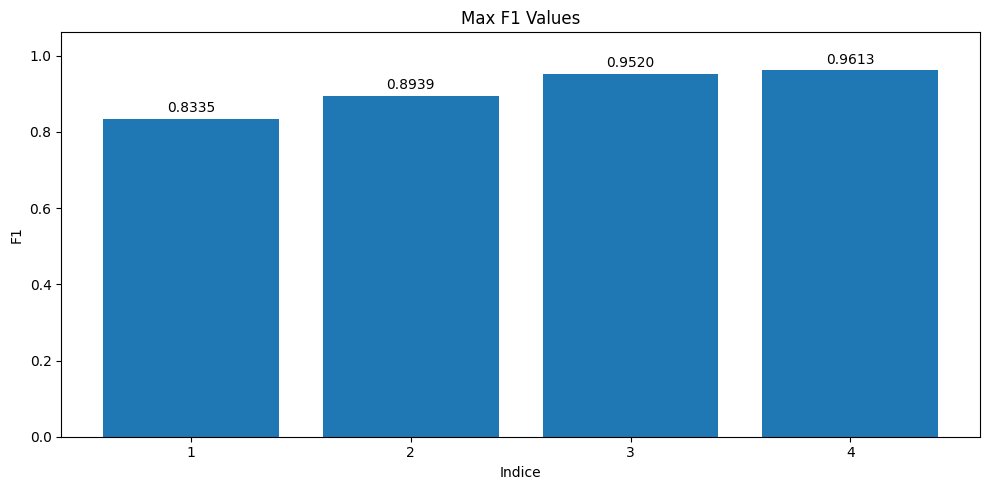

In [ ]:
# Fondere df e dv
combined_df = pd.merge(df, dv, on=['Indice', 'Epoch', 'Learning Rate'])

# Calcolare il valore massimo di F1 per ciascun indice
max_f1_values = combined_df.groupby('Indice')['F1'].max()

# Estrarre gli indici unici
indici = max_f1_values.index


# Estrarre i valori di F1 massimi
f1_values = max_f1_values.values


fig, axs = plt.subplots(1, figsize=(10, 5))

axs.bar(indici, f1_values)

for i, val in enumerate(f1_values):
    axs.text(i+1, val + 0.01, f'{val:.4f}', ha='center', va='bottom')



# Titoli e etichette
plt.title('Max F1 Values')
plt.xlabel('Indice')
plt.ylabel('F1')
plt.xticks(indici)
plt.ylim(0, max(f1_values) + 0.1)  # Impostare i limiti dell'asse y

plt.grid(False)
plt.tight_layout()
plt.show()

## Augmentation

Una volta trovato il lr migliore faccio augumentation sul train in modo da allenare un nuovo modello più efficiente

In [ ]:
train_transform = transforms.Compose([
                                     transforms.RandomHorizontalFlip(),
                                     transforms.RandomVerticalFlip(),
                                     transforms.RandomRotation(degrees=(0,270)),
                                     transforms.Normalize(data_mean, data_std)
                                     ])

In [ ]:
tet_transform = transforms.Compose([
    trsansforms.Normalize(data_mean, data_std)
])

In [ ]:
train_set=CloudDataset1(train_file,train_transform)
val_set=CloudDataset1(val_file, test_transform)

In [ ]:
train_loader = data.DataLoader(train_set, batch_size=8, shuffle=True)
val_loader = data.DataLoader(val_set, batch_size=8, shuffle=False)

## Training, Validation e Test



### Training, Validation

In [ ]:
def acc_metric(predb, yb):
  return (predb.argmax(dim=1) == yb.cuda()).float().mean()

In [ ]:
def trainf(model, device, optimizer, loss_fn, lr, epochs, train_loader, val_loader, validate_filename, acc_fn, nome, log_interval=200):
    # Set model to train mode
    model.train()
    train_losses = []
    train_acc = []
    best_f1 = -1000
    best_model_state_dict = None

    # Training loop
    for epoch in  range(epochs):
      total_loss = 0
      accuracy = 0
      for batch_idx, (x, target_label) in enumerate(train_loader):
           x=x.to(device)
           target_label=target_label.to(device)

           optimizer.zero_grad()
           output = model(x)
           loss = loss_fn(output, target_label)
           loss.backward()
           optimizer.step()

           total_loss += loss.item()*train_loader.batch_size
           acc = (acc_fn(output, target_label).item())*train_loader.batch_size
           accuracy += acc
           if batch_idx % log_interval == 0:
              print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch,
                    batch_idx * len(x),
                    len(train_loader.dataset),
                    100. * batch_idx / len(train_loader),
                    loss.item()
              ))


      train_losses.append(total_loss / len(train_loader.dataset))
      train_acc.append(accuracy / len(train_loader.dataset))

      print(f'Accuracy-> {(accuracy / len(train_loader.dataset)) * 100:.2f}%')

      val_loss, val_acc, precision, recall, f1_score = validatef(model, device, loss_fn, val_loader, acc_fn)

      if best_f1 < f1_score:
        best_f1 = f1_score
        print("cambio best f1->",best_f1 )
        best_model_state_dict = model.state_dict()


      with open(validate_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([lr,  epoch + 1, val_loss, val_acc, precision, recall, f1_score])



    print("=> Salvataggio checkpoint")
    torch.save({'model_state_dict':best_model_state_dict,
                'optimizer_state_dict': optimizer.state_dict(),
                'best_f1': f1_score
                }, f'{nome}.pt')

    print("salvataggio avvennuto")

    return train_losses, train_acc

In [ ]:
def flatten(xss):
    return [x for xs in xss for x in xs]

In [ ]:
def validatef(model, device, loss_fn, validation_loader, acc_fn):
    print("inizio validazione->")
    model.eval()
    val_loss, correct = 0, 0
    y_pred=[]
    y_true=[]
    y_pred_flat=[]
    y_true_flat=[]

    # Disabilito il calcolo del gradiente per velocizzare
    with torch.no_grad():
        # Loop over each batch from the validation set
        for x, y in validation_loader:
            x=x.to(device)
            y=y.to(device)
            # Calcolo output usando i dati come input per la rete
            outputs = model(x)

            loss = loss_fn(outputs, y.long())

            # Calcolo loss usando criterion
            val_loss += loss.item()*validation_loader.batch_size
            # Calcolo accuratezza
            acc = (acc_fn(outputs, y).item())*validation_loader.batch_size
            correct += acc

            y_true.extend(y.cpu().numpy()) # Converti in array numpy e appiattisci
            y_pred.extend(outputs.squeeze().cpu().argmax(axis=1).numpy())# Converti in array numpy e appiattisci

    print("calcolo recall, f1 e precision")
    y_pred_flat=flatten(y_pred)


    y_true_flat=flatten(y_true)

    val_loss /= len(validation_loader.dataset)
    accuracy = (correct / len(validation_loader.dataset))
    accuracy=accuracy*100


    precision=precision_score(y_true_flat, y_pred_flat, average='macro')
    recall=recall_score(y_true_flat, y_pred_flat, average='macro')
    f1=f1_score(y_true_flat, y_pred_flat, average='macro')

    print('\nValidation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%), F1-score: {:.4f}\n'.format(
    val_loss,
    correct,
    len(validation_loader.dataset),
    accuracy,
    f1
    ))
    return val_loss, accuracy, precision, recall, f1

In [ ]:
lr = 1e-5
num_epochs=10

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailedf.csv'
validate_filename = 'validate_resultf.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


print("inizio training per il modello con lr: ", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)

nome='xy_model'


optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, criterion, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric, nome)

with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])


### Grafici su Validation e Training

Ora faccio un grafico con Validation e Training con accuracy e Loss.


In [ ]:
# Risultati salvati nel file csv

# Carica i dati dal file CSV
file_path = 'training_results_detailedf_xy.csv'
df = pd.read_csv(file_path)
file_path = 'validate_resultf_xy.csv'
dv=pd.read_csv(file_path)


print(df.head())
print(dv.head())

In [ ]:
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(10, 14))


# Grafico della Loss per l'indice corrente

plt.subplot(2,1,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,1,2)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
epochs = dv['Epoch'].unique()  # Prendi gli epoch univoci

plt.figure(figsize=(10, 14))

# Grafico del F1-score
plt.subplot(3, 1, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

# Grafico del Recall
plt.subplot(3, 1, 2)
plt.plot(dv['Epoch'], dv['Recall'], marker='o', color='red')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

# Grafico della Precision
plt.subplot(3, 1, 3)
plt.plot(dv['Epoch'], dv['Precision'], marker='o', color='blue')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.tight_layout()
plt.show()

### Stampo Predizioni Validation

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('xy_model.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 3 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

## Nuova idea

Poichè ho ottenuto dei valori non del tutto soddifacenti poichè osservando il dataset noto che sono più gli elementi "non nuvola" che quelli nuvola vorrei fare in modo che si desse più peso alla calsse Nuvola rispetto a quella non Nuvola.


In [ ]:
def conta_pix(data):
  clouds = 0
  no_clouds = 0
  for i in range(len(data)):
    array = data[i][1].flatten()
    nc = np.count_nonzero(array)
    nn = len(array) - nc
    clouds += nc
    no_clouds += nn
  return (no_clouds, clouds)

In [ ]:
no_clouds, clouds = conta_pix(dati)
print("numero non nuvole:", no_clouds)
print("numero nuvole:", clouds)
print(clouds/no_clouds) #Risultato rapporto

numero non nuvole: 692015095
numero nuvole: 298889225
0.43191142383967795


### Train e Validation

il resto del codice resta uguale  e non ho effettuato cambiamenti

#### Con pesi 0,43

ho provato con pesidi 0.43 e 1 e lr=1e-5 io 10 epoche

In [ ]:
loss_fn = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.43,1]).to(device))

In [ ]:
lr = 1e-5
num_epochs=10

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailed_pesi.csv'
validate_filename = 'validate_result_pesi.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


print("inizio training per il modello con lr: ", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)


nome='model_pesi'

optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric, nome)

with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

#### con pesi 0.23

ho provato anche a cambiare il lr in questo caso

In [ ]:
loss_fn2 = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.23,1]).to(device))

In [ ]:
lr = 1e-5
num_epochs=10

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailed_pesi2.csv'
validate_filename = 'validate_result_pesi2.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


print("inizio training per il modello con lr: ", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)


nome='model_pesi2'


optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn2, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

### Stampa Grafici

come nel caso di prima procedo a fare le stesse identiche cose

In [ ]:
file_path = 'training_results_detailed_pesi.csv'
df = pd.read_csv(file_path)
file_path = 'validate_result_pesi.csv'
dv=pd.read_csv(file_path)

file_path = 'training_results_detailed_pesi2.csv'
df2 = pd.read_csv(file_path)
file_path = 'validate_result_pesi2.csv'
dv2=pd.read_csv(file_path)



In [ ]:
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

combined_df2  = pd.merge(df2, dv2, on=['Epoch', 'Learning Rate'])
combined_df2 ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()
epoche2 = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(14, 14))

# Grafico della Loss per l'indice corrente

plt.subplot(2,2,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss 0.43')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


plt.subplot(2, 2, 2)
plt.plot(combined_df2['Epoch'], combined_df2['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df2['Epoch'], combined_df2['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss 0.23')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,2,3)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy 0.43')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


plt.subplot(2, 2, 4)
plt.plot(combined_df2['Epoch'], combined_df2['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df2['Epoch'], combined_df2['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy 0.23')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
epochs = dv['Epoch'].unique()  # Prendi gli epoch univoci
epochs=dv2['Epoch'].unique()
plt.figure(figsize=(15, 17))

# Grafico del F1-score
plt.subplot(3, 2, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score 0.43')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.plot(dv2['Epoch'], dv2['F1'], marker='o', color='green')
plt.title('F1-score 0.023')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

# Grafico del Recall
plt.subplot(3, 2, 3)
plt.plot(dv['Epoch'], dv['Recall'], marker='o', color='red')
plt.title('Recall 0.43')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

plt.subplot(3, 2, 4)
plt.plot(dv2['Epoch'], dv2['Recall'], marker='o', color='red')
plt.title('Recall 0.023')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

# Grafico della Precision
plt.subplot(3, 2, 5)
plt.plot(dv['Epoch'], dv['Precision'], marker='o', color='blue')
plt.title('Precision 0.43')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.subplot(3, 2, 6)
plt.plot(dv2['Epoch'], dv2['Precision'], marker='o', color='blue')
plt.title('Precision 0.23')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.tight_layout()
plt.show()

### Stampo predizioni Validation

con peso 0.23

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('model_pesi2.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 3 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('model_pesi.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 3 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

### Provo con epoche in più

Sembra  che il modello con pesi 0,43 faccia predizioni migliori, decido quindi di fare un ultimo tentativo usando sempre il peso 0,43 ma un lr di 0.01 e aumentando leggeremente le epoche portandole a 15.

In [ ]:
loss_fn = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.43,1]).to(device))

In [ ]:
lr = 1e-5
num_epochs=15

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailed_pesi15.csv'
validate_filename = 'validate_result_pesi15.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


print("inizio training per il modello con lr: ", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)


nome='model_pesi3'

optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric, nome)

with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

### Ultimo confronto grafici

faccio un ultimo confronto tra i dati ricavati facendo con pesi di 0.43 con 10 epoche e con 15 epoche per vedere se ci sono miglioramenti o solo overfitting

In [ ]:
file_path = 'training_results_detailed_pesi.csv'
df = pd.read_csv(file_path)
file_path = 'validate_result_pesi.csv'
dv=pd.read_csv(file_path)

file_path = 'training_results_detailed_pesi3.csv'
df2 = pd.read_csv(file_path)
file_path = 'validate_result_pesi3.csv'
dv2=pd.read_csv(file_path)

In [ ]:
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

combined_df2  = pd.merge(df2, dv2, on=['Epoch', 'Learning Rate'])
combined_df2 ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()
epoche2 = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(14, 14))

# Grafico della Loss per l'indice corrente

plt.subplot(2,2,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss 10 epoche')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


plt.subplot(2, 2, 2)
plt.plot(combined_df2['Epoch'], combined_df2['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df2['Epoch'], combined_df2['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss 15 epoche')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,2,3)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy 10 epoche')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


plt.subplot(2, 2, 4)
plt.plot(combined_df2['Epoch'], combined_df2['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df2['Epoch'], combined_df2['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy 15 epoche')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
epochs = dv['Epoch'].unique()  # Prendi gli epoch univoci
epochs=dv2['Epoch'].unique()
plt.figure(figsize=(15, 17))

# Grafico del F1-score
plt.subplot(3, 2, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score 10')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.plot(dv2['Epoch'], dv2['F1'], marker='o', color='green')
plt.title('F1-score 15')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

# Grafico del Recall
plt.subplot(3, 2, 3)
plt.plot(dv['Epoch'], dv['Recall'], marker='o', color='red')
plt.title('Recall 10')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

plt.subplot(3, 2, 4)
plt.plot(dv2['Epoch'], dv2['Recall'], marker='o', color='red')
plt.title('Recall 15')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

# Grafico della Precision
plt.subplot(3, 2, 5)
plt.plot(dv['Epoch'], dv['Precision'], marker='o', color='blue')
plt.title('Precision 10')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.subplot(3, 2, 6)
plt.plot(dv2['Epoch'], dv2['Precision'], marker='o', color='blue')
plt.title('Precision 15')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.tight_layout()
plt.show()

### Predizioni

In [ ]:
model = UNET(in_channels=4, out_channels=2)
model1= UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('model_pesi3.pt',map_location=torch.device('cpu'))
model.load_state_dict(checkpoint['model_state_dict'])
checkpoint1 = torch.load('model_pesi.pt', map_location=torch.device('cpu'))
model1.load_state_dict(checkpoint1['model_state_dict'])
model.to(device)
model1.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(8):  # Visualizza i risultati per 7 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))
        predb1 = model1(xb.to(device))

        fig, ax = plt.subplots(8, 4 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))
            ax[i,3].imshow(predb_to_mask(predb1, i))

        plt.tight_layout()
        plt.show()

## Test

### Preparazione dataset

Non avendo il gt ho fatto semplicemente la predizione, ovvero stampo la mia predizione e l'imput ma non posso confrontarlo con il gt

In [ ]:
def combinet(r_file: Path, g, b, nir):
        # Combina i percorsi dei file delle diverse bande in un dizionario
        #il percorso r_file è come la base per crere il dizionario e
        #per gli altri uso come base il nome del percorso rosso dove vado a cambaire
        #"red" con la banda di interesse
        files = {'red': r_file,
                 'green':g/r_file.name.replace('red', 'green'),
                 'blue': b/r_file.name.replace('red', 'blue'),
                 'nir': nir/r_file.name.replace('red', 'nir')
                 }

        return files

In [ ]:
base_path = Path('38-Cloud_test')
r=base_path/'test_red'
g=base_path/'test_green'
b=base_path/'test_blue'
nir=base_path/'test_nir'
test_files = [combinet(f, g, b, nir) for f in r.iterdir() if not f.is_dir()]

In [ ]:
class CloudDatasetTest(torch.utils.data.Dataset):
    def __init__(self, files,pytorch=True, transform=None):
        super().__init__()
        self.files = files
        self.transform = transform
        self.pytorch=pytorch

    def __len__(self):
        # Restituisce la lunghezza del dataset(numero dei file)
        return len(self.files)


    def open_as_array(self, idx, invert=False, include=False):
        # Apre le immagini in posizione idx e le converto in un array NumPy utile per PyTorch

        # Carica le bande RGB
        rgb = np.stack([np.array(Image.open(self.files[idx]['red'])),
                            np.array(Image.open(self.files[idx]['green'])),
                            np.array(Image.open(self.files[idx]['blue'])),
                           ], axis=2) #axis 2 indica di impilare lungo la terza dim dell'array
        # il nostro rgb dovrebbe ora essere un array con 3 dimensioni di cui le prime due sono h e w e l'ultima rapprensenza
        # il numero di canali in questo caso 3 (non c'è nir)

        # Aggiunge la banda NIR all'array se richiesto (ora avrei 4 canali)
        if include:
            nir = np.expand_dims(np.array(Image.open(self.files[idx]['nir'])), 2)
            rgb = np.concatenate([rgb, nir], axis=2)

        #inverte gli assi dell'array per renderlo compatibile con la convenzione PyTorch (canali prima di altezza e larghezza)
        if invert:
            rgb = rgb.transpose((2,0,1))

        # Normalizza i valori dell'array ho dovuto fare questo passaggio perchè avevo problemi con i valori e
        # cercando informazioni online questa risulta la cosa migliore per normalizzare i dati dividendoli per il più
        #alto valore possibile dell'array portando l'immagine tra 0 e 1
        return rgb / np.iinfo(rgb.dtype).max




    def __getitem__(self, idx):
        # Carica l'immagine come tensore PyTorch ovvero devo anceh invertire gli assi
        x = torch.tensor(self.open_as_array(idx, invert=self.pytorch, include=True), dtype=torch.float32)

        if self.transform is not None:
            x = self.transform(x)

        return x


    def __repr__(self):
        # Rappresentazione testuale della classe
        s = 'Dataset class with {} files'.format(self.__len__())

        return s

In [ ]:
test_set=CloudDatasetTest(test_files, test_transform)
test_loader = data.DataLoader(test_set, batch_size=8, shuffle=False)
print(test_set)

Dataset class with 9201 files


### Senza Pesi

Predizioni del test senza pesi

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('xy_model.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)

test_loader_iter = iter(test_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 2 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

### Con Pesi

Predizioni test Con pesi

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('model_pesi.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)

test_loader_iter = iter(test_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 2 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

## Prova delle 2 migliori soluzioni con 30 epoche


In [ ]:
loss_fn = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.43,1]).to(device))

il primo ovvero 30_1  sarà fatto con i pesi ma usando argumentation

In [ ]:
lr = 1e-5
num_epochs=30

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailed_30_1.csv'
validate_filename = 'validate_result_30_1.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


print("inizio training per il modello con lr: ", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)


nome='30_1'

optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric, nome)

with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

il secondo 30_2 sarà invece senza augumentation, con pesi

In [ ]:
train_file, val_file = data.random_split(files, [0.8, 0.2])
train_set=CloudDataset1(train_file)
val_set=CloudDataset1(val_file)
train_loader = data.DataLoader(train_set, batch_size=8, shuffle=True)
val_loader = data.DataLoader(val_set, batch_size=8, shuffle=False)

In [ ]:
lr = 1e-5
num_epochs=30

#creo i due file csv dove salvo i dati

results_filename = 'training_results_detailed_30_2.csv'
validate_filename = 'validate_result_30_2.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


print("inizio training per il modello con lr: ", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)


nome='30_2'

optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric, nome)

with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

### Grafici

In [ ]:
file_path = 'training_results_detailed_30_1.csv'
df = pd.read_csv(file_path)
file_path = 'validate_result_30_1.csv'
dv=pd.read_csv(file_path)

file_path = 'training_results_detailed_30_2.csv'
df2 = pd.read_csv(file_path)
file_path = 'validate_result_30_2.csv'
dv2=pd.read_csv(file_path)

In [ ]:
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

combined_df2  = pd.merge(df2, dv2, on=['Epoch', 'Learning Rate'])
combined_df2 ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()
epoche2 = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(14, 14))

# Grafico della Loss per l'indice corrente

plt.subplot(2,2,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss con augmentation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


plt.subplot(2, 2, 2)
plt.plot(combined_df2['Epoch'], combined_df2['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df2['Epoch'], combined_df2['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss senza augmentation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,2,3)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy con augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)


plt.subplot(2, 2, 4)
plt.plot(combined_df2['Epoch'], combined_df2['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df2['Epoch'], combined_df2['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy senza augmentation')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

solo le validation

In [ ]:

plt.figure(figsize=(20, 20))

# Grafici per ogni trial
plt.subplot(2,2,1)
plt.plot(dv['Epoch'], dv['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss con' )
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation'], loc='upper left')
plt.grid(True)

plt.subplot(2,2,2)
plt.plot(dv2['Epoch'], dv2['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss senza' )
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Validation'], loc='upper left')
plt.grid(True)

plt.subplot(2,2,3)
plt.plot(dv['Epoch'], dv['Validation Accuracy'], marker='o', label='Validation Loss', color='orange')
plt.title('Accuracy con' )
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Validation'], loc='upper left')
plt.grid(True)

plt.subplot(2,2,4)
plt.plot(dv2['Epoch'], dv2['Validation Accuracy'], marker='o', label='Validation Loss', color='orange')
plt.title('Accuracy senza' )
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:

plt.figure(figsize=(15, 17))

# Grafico del F1-score
plt.subplot(3, 2, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score con')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

plt.subplot(3, 2, 2)
plt.plot(dv2['Epoch'], dv2['F1'], marker='o', color='green')
plt.title('F1-score senza')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)



### predizioni validation

In [ ]:
def batch_to_img(xb, idx):
    img = np.array(xb[idx,0:3])
    return img.transpose((1,2,0))

def predb_to_mask(predb, idx):
    p = torch.functional.F.softmax(predb[idx], 0)
    return p.argmax(0).cpu()

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('30_1.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 3 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

In [ ]:
train_set=CloudDataset1(train_file)
val_set=CloudDataset1(val_file)
train_loader = data.DataLoader(train_set, batch_size=8, shuffle=True)
val_loader = data.DataLoader(val_set, batch_size=8, shuffle=False)

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('30_2.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 3 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

### sul test set

In [ ]:
test_set=CloudDatasetTest(test_files, test_transform)
test_loader = data.DataLoader(test_set, batch_size=8, shuffle=False)
print(test_set)

Dataset class with 9201 files


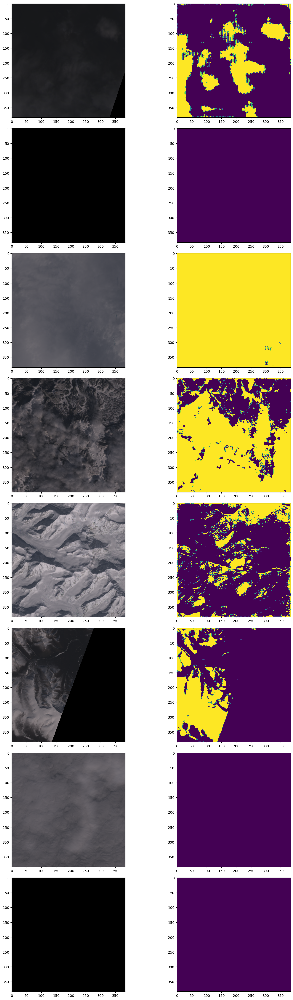

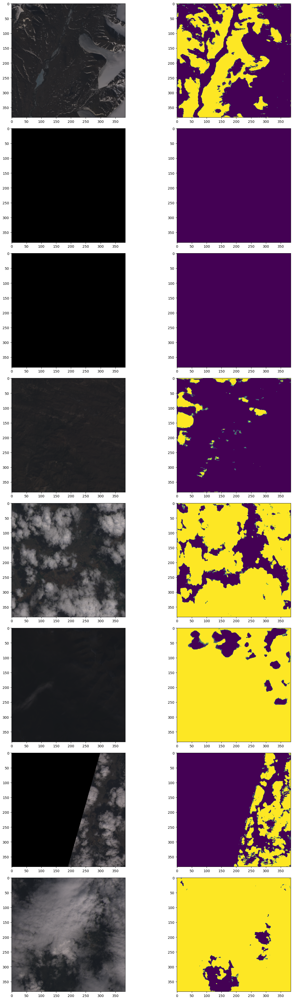

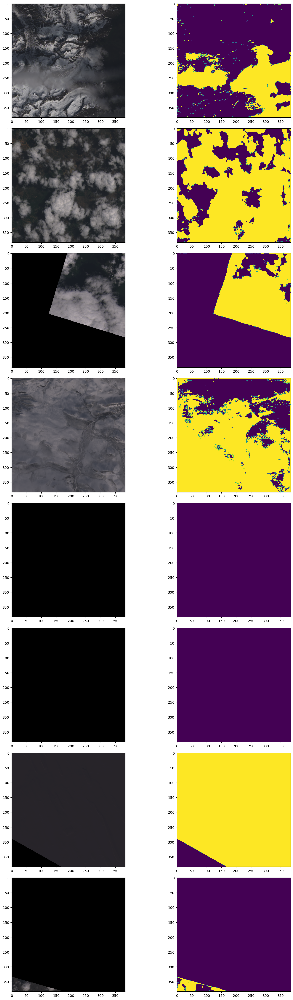

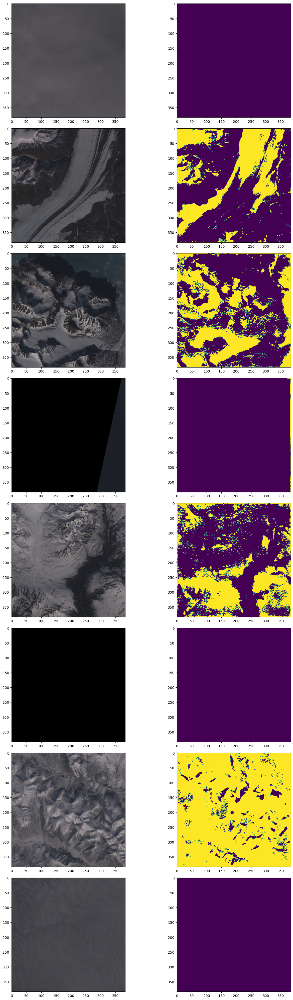

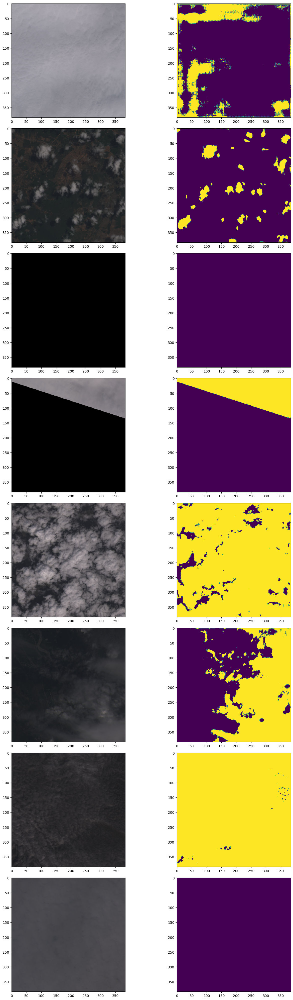

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('30_1.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)

test_loader_iter = iter(test_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 2 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

In [ ]:
test_set=CloudDatasetTest(test_files)
test_loader = data.DataLoader(test_set, batch_size=8, shuffle=False)

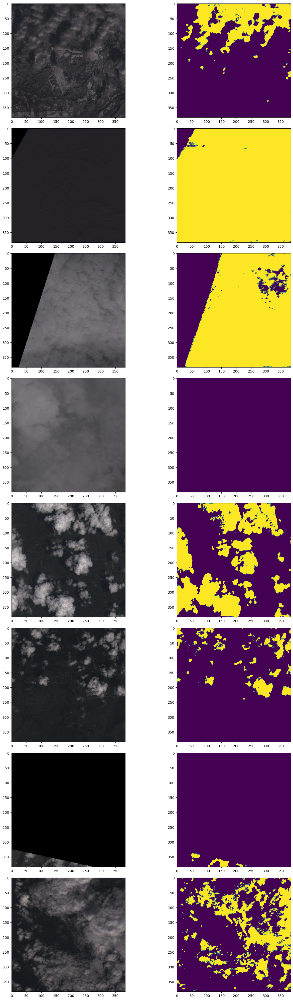

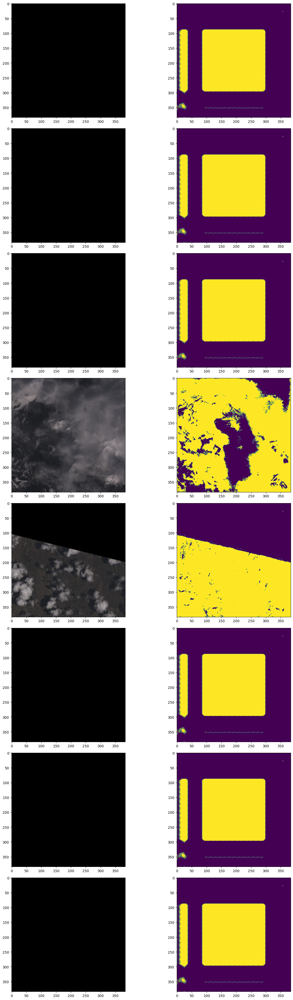

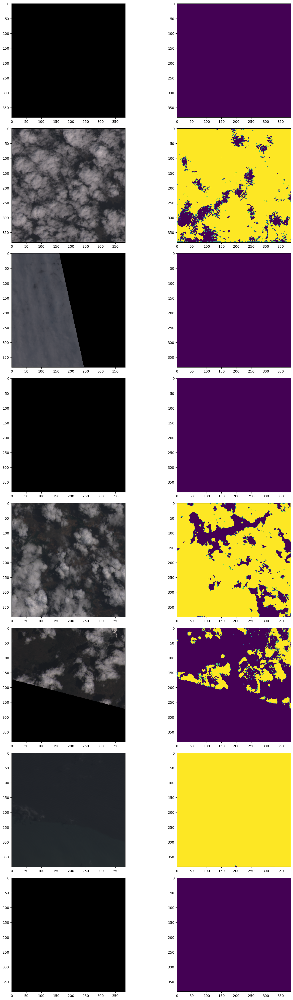

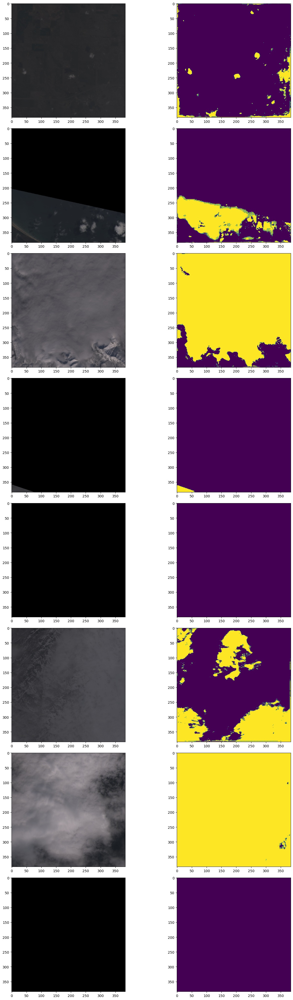

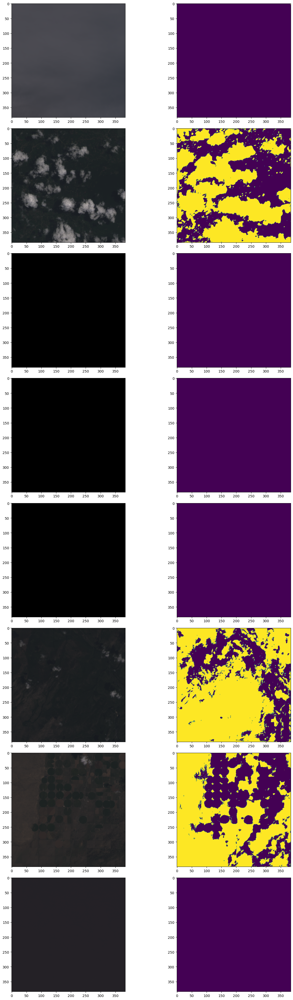

In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load('30_2.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)

test_loader_iter = iter(test_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 4 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(8, 2 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

# CONCLUSIONE

#Prova senza immagini nere

viene rieseguito tutto il processo effettuato in precedenza ma in questo caso non ci saranno immagini completatmente nere

##LR

###Train e validation

In [ ]:
def acc_metric(predb, yb):
  return (predb.argmax(dim=1) == yb.cuda()).float().mean() #facendo la media si ottiene una stima più robusta e affidabile dell'accuratezza del modello.

In [ ]:
def train(indice, model, device, optimizer, loss_fn, lr, epochs, train_loader, val_loader, validate_filename, acc_fn, log_interval=200):
    # Set model to train mode
    model.train()
    train_losses = []
    train_acc = []
    best_f1 = -1000
    best_model_state_dict = None
    save_path=root+'model_'+str(indice)+'.pt'

    # Training loop
    for epoch in  range(epochs):
      total_loss = 0
      accuracy = 0
      for batch_idx, (x, target_label) in enumerate(train_loader):
           x=x.to(device)
           target_label=target_label.to(device)

           optimizer.zero_grad()
           output = model(x)
           loss = loss_fn(output, target_label)
           loss.backward()
           optimizer.step()

           total_loss += loss.item()*train_loader.batch_size # in questo modo peso la loss in base al batch
           acc = (acc_fn(output, target_label).item())*train_loader.batch_size # in questo modo peso l'accuratezza in base al batch
           accuracy += acc
           if batch_idx % log_interval == 0:
              print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch,
                    batch_idx * len(x),
                    len(train_loader.dataset),
                    100. * batch_idx / len(train_loader),
                    loss.item()
              ))


      train_losses.append(total_loss / len(train_loader.dataset))
      train_acc.append(accuracy / len(train_loader.dataset))

      print(f'Accuracy-> {(accuracy / len(train_loader.dataset)) * 100:.2f}%')

      val_loss, val_acc, precision, recall, f1_score = validate(model, device, loss_fn, val_loader, acc_fn)

      if best_f1 < f1_score:
        best_f1 = f1_score
        print("cambio best f1->",best_f1 )
        best_model_state_dict = model.state_dict()
        print("salvataggio modello \n")
        torch.save({'model_state_dict':best_model_state_dict,
                'optimizer_state_dict': optimizer.state_dict(),
                'best_f1': f1_score,
                'epoca':epoch
        }, save_path)
        print("salvataggio avvenuto \n")


      with open(validate_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([indice, lr,  epoch + 1, val_loss, val_acc, precision, recall, f1_score])


    return train_losses, train_acc

In [ ]:
def flatten(xss):
    return [x for xs in xss for x in xs]

In [ ]:
def validate(model, device, loss_fn, validation_loader, acc_fn):
    print("inizio validazione")
    model.eval()
    val_loss, correct = 0, 0
    y_pred=[]
    y_true=[]
    y_pred_flat=[]
    y_true_flat=[]

    # Disabilito il calcolo del gradiente per velocizzare
    with torch.no_grad():

        for x, y in validation_loader:
            x=x.to(device)
            y=y.to(device)
            # Calcolo output usando i dati come input per la rete
            outputs = model(x)
            loss = loss_fn(outputs, y.long())
            # Calcolo loss usando criterion
            val_loss += loss.item()*validation_loader.batch_size
            # Calcolo accuratezza
            acc = (acc_fn(outputs, y).item())*validation_loader.batch_size
            correct += acc

            y_true.extend(y.cpu().numpy()) # Converti in array numpy e appiattisci
            y_pred.extend(outputs.squeeze().cpu().argmax(axis=1).numpy())# Converti in array numpy e appiattisci

    print("calcolo recall, f1 e precision")
    y_pred_flat=flatten(y_pred)
    y_true_flat=flatten(y_true)


    # Calcola la media della loss e dell'accuratezza sul set di validazione
    val_loss /= len(validation_loader.dataset)
    accuracy = (correct / len(validation_loader.dataset))
    accuracy=accuracy*100

    precision=precision_score(y_true_flat, y_pred_flat, average='macro')
    recall=recall_score(y_true_flat, y_pred_flat, average='macro')
    f1=f1_score(y_true_flat, y_pred_flat, average='macro')

    print('Validation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%), F1-score: {:.4f}\n'.format(
    val_loss,
    correct,
    len(validation_loader.dataset),
    accuracy,
    f1
    ))
    return val_loss, accuracy, precision, recall, f1

### Decisione Lr

In [ ]:
import gc

In [ ]:
learning_rates1 = [1e-2, 1e-3, 1e-4, 1e-5]
num_epochs=10
loss_fn = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.83,1]).to(device))
#creo i due file csv dove salvo i dati

results_filename = root+'training_results_detailed_nn.csv'
validate_filename =root+ 'validate_result_nn.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Indice','Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Indice', 'Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])


i=1

for lr in learning_rates1:
  print("inizio training per il modello con lr:", lr)
  model= UNET(in_channels=4, out_channels=2)
  model=model.to(device)


  optimizer=optim.Adam(model.parameters(), lr=lr)

  train_losses, train_acc = train(i, model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

  del model
  del optimizer
  gc.collect()
  torch.cuda.empty_cache()

  with open(results_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        for epoch in range(num_epochs):
            writer.writerow([i, lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])
  i+=1

###grafici

In [ ]:
file_path = 'training_results_detailed_nn.csv'
df = pd.read_csv(file_path)
file_path = 'validate_result_nn.csv'
dv=pd.read_csv(file_path)


print(df.head())
print(dv.head())

In [ ]:
combined_df  = pd.merge(df, dv, on=['Indice','Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

indici = combined_df['Indice'].drop_duplicates()

plt.figure(figsize=(14, 7*len(indici)))


for i, indice  in enumerate(indici, start=1):
    # Filtraggio dei dati per la combinazione corrente
    filtered_df = combined_df.loc[combined_df['Indice'] == indice]

    # Estrarre il learning rate corrispondente
    lr = filtered_df['Learning Rate'].iloc[0]

    # Grafico della Loss per l'indice corrente
    plt.subplot(len(indici), 2, i*2-1)
    plt.plot(filtered_df['Epoch'], filtered_df['Train Loss'], marker='o', label='Train Loss', color='blue')
    plt.plot(filtered_df['Epoch'], filtered_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
    plt.title(f'Loss (Prova {indice} LR {lr})')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.grid(True)

    # Grafico dell'Accuracy per l'indice corrente
    plt.subplot(len(indici), 2, i*2)
    plt.plot(filtered_df['Epoch'], filtered_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
    plt.plot(filtered_df['Epoch'], filtered_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
    plt.title(f'Accuracy (Prova {indice} LR {lr})')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# Fondere df e dv
combined_df = pd.merge(df, dv, on=['Indice', 'Epoch', 'Learning Rate'])

# Calcolare il valore massimo di F1 per ciascun indice
max_f1_values = combined_df.groupby('Indice')['F1'].max()

# Estrarre gli indici unici
indici = max_f1_values.index


# Estrarre i valori di F1 massimi
f1_values = max_f1_values.values


fig, axs = plt.subplots(1, figsize=(10, 5))

axs.bar(indici, f1_values)

for i, val in enumerate(f1_values):
    axs.text(i+1, val + 0.01, f'{val:.4f}', ha='center', va='bottom')



# Titoli e etichette
plt.title('Max F1 Values')
plt.xlabel('Indice')
plt.ylabel('F1')
plt.xticks(indici)
plt.ylim(0, max(f1_values) + 0.1)  # Impostare i limiti dell'asse y

plt.grid(False)
plt.tight_layout()
plt.show()

## Augumentation

In [ ]:
def get_train_augmentations():

      transforms=[]
      transforms.extend([
          A.HorizontalFlip(p=0.5),
          A.VerticalFlip(p=0.5),
          A.RandomRotate90(p=1.0),

      ])

      return A.Compose(transforms)

Nor=transforms.Compose([
    transforms.Normalize(data_mean, data_std)
])

In [ ]:
train_set=CloudDataset1(train_file,transform=True, trasformN=Nor)
val_set=CloudDataset1(val_file, transform=False, trasformN=Nor)

In [ ]:
train_loader = data.DataLoader(train_set, batch_size=12, shuffle=True)
val_loader = data.DataLoader(val_set, batch_size=12, shuffle=False)

## Train e validation finale

### Train e val

In [ ]:
def acc_metric(predb, yb):
  return (predb.argmax(dim=1) == yb.cuda()).float().mean()
def trainf(model, device, optimizer, loss_fn, lr, epochs, train_loader, val_loader, validate_filename, acc_fn, log_interval=200):
    # Set model to train mode
    model.train()
    train_losses = []
    train_acc = []
    best_f1 = -1000
    best_model_state_dict = None
    save_path=root+'model_finale'+str(epochs)+'_'+str(lr)+'.pt'

    # Training loop
    for epoch in  range(epochs):
      total_loss = 0
      accuracy = 0
      for batch_idx, (x, target_label) in enumerate(train_loader):
           x=x.to(device)
           target_label=target_label.to(device)

           optimizer.zero_grad()
           output = model(x)
           loss = loss_fn(output, target_label)
           loss.backward()
           optimizer.step()

           total_loss += loss.item()*train_loader.batch_size
           acc = (acc_fn(output, target_label).item())*train_loader.batch_size
           accuracy += acc
           if batch_idx % log_interval == 0:
              print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch,
                    batch_idx * len(x),
                    len(train_loader.dataset),
                    100. * batch_idx / len(train_loader),
                    loss.item()
              ))


      train_losses.append(total_loss / len(train_loader.dataset))
      train_acc.append(accuracy / len(train_loader.dataset))

      print(f'Accuracy-> {(accuracy / len(train_loader.dataset)) * 100:.2f}%')

      val_loss, val_acc, precision, recall, f1_score = validatef(model, device, loss_fn, val_loader, acc_fn)


      if best_f1 < f1_score:
        best_f1 = f1_score
        print("cambio best f1->",best_f1 )
        best_model_state_dict = model.state_dict()
        print("salvataggio modello \n")
        torch.save({'model_state_dict':best_model_state_dict,
                'optimizer_state_dict': optimizer.state_dict(),
                'best_f1': f1_score,
                'epoca':epoch
        }, save_path)
        print("salvataggio avvenuto \n")

      with open(validate_filename, 'a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([lr,  epoch + 1, val_loss, val_acc, precision, recall, f1_score])





    print("salvataggio avvennuto")

    return train_losses, train_acc

In [ ]:
def flatten(xss):
    return [x for xs in xss for x in xs]

In [ ]:
def validatef(model, device, loss_fn, validation_loader, acc_fn):
    print("inizio validazione->")
    model.eval()
    val_loss, correct = 0, 0
    y_pred=[]
    y_true=[]
    y_pred_flat=[]
    y_true_flat=[]

    # Disabilito il calcolo del gradiente per velocizzare
    with torch.no_grad():
        # Loop over each batch from the validation set
        for x, y in validation_loader:
            x=x.to(device)
            y=y.to(device)
            # Calcolo output usando i dati come input per la rete
            outputs = model(x)

            loss = loss_fn(outputs, y.long())

            # Calcolo loss usando criterion
            val_loss += loss.item()*validation_loader.batch_size
            # Calcolo accuratezza
            acc = (acc_fn(outputs, y).item())*validation_loader.batch_size
            correct += acc

            y_true.extend(y.cpu().numpy()) # Converti in array numpy e appiattisci
            y_pred.extend(outputs.squeeze().cpu().argmax(axis=1).numpy())# Converti in array numpy e appiattisci

    print("calcolo recall, f1 e precision")
    y_pred_flat=flatten(y_pred)


    y_true_flat=flatten(y_true)

    val_loss /= len(validation_loader.dataset)
    accuracy = (correct / len(validation_loader.dataset))
    accuracy=accuracy*100


    precision=precision_score(y_true_flat, y_pred_flat, average='macro')
    recall=recall_score(y_true_flat, y_pred_flat, average='macro')
    f1=f1_score(y_true_flat, y_pred_flat, average='macro')

    print('\nValidation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%), F1-score: {:.4f}\n'.format(
    val_loss,
    correct,
    len(validation_loader.dataset),
    accuracy,
    f1
    ))
    return val_loss, accuracy, precision, recall, f1

### Esecuzione

primo tentativo con pesi e lr=1e-5

In [ ]:
lr = 1e-5
num_epochs=10
loss_fn = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.83,1]).to(device))
#creo i due file csv dove salvo i dati

results_filename = root+'training_results_detailed_10.csv'
validate_filename =root+ 'validate_result_10.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])



print("inizio training per il modello con lr:", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)
optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

del model
del optimizer
gc.collect()
torch.cuda.empty_cache()

with open(results_filename, 'a', newline='') as file:
      writer = csv.writer(file)
      for epoch in range(num_epochs):
           writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

senza pesi

In [ ]:
lr = 1e-5
num_epochs=11
loss_fn = torch.nn.CrossEntropyLoss()
#creo i due file csv dove salvo i dati

results_filename = root+'training_results_detailed_11.csv'
validate_filename =root+ 'validate_result_11.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])



print("inizio training per il modello con lr:", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)
optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

del model
del optimizer
gc.collect()
torch.cuda.empty_cache()

with open(results_filename, 'a', newline='') as file:
      writer = csv.writer(file)
      for epoch in range(num_epochs):
           writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

provo con un lr diverso

In [ ]:
lr = 0.0001
num_epochs=10
loss_fn = torch.nn.CrossEntropyLoss(weight = torch.tensor([0.83,1]).to(device))
#creo i due file csv dove salvo i dati

results_filename = root+'training_results_detailed_10_1.csv'
validate_filename =root+ 'validate_result_10_1.csv'

with open(results_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Train Loss', 'Train Accuracy'])

with open(validate_filename, 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Learning Rate', 'Epoch', 'Validation Loss', 'Validation Accuracy', 'Precision', 'Recall', 'F1'])



print("inizio training per il modello con lr:", lr)
model= UNET(in_channels=4, out_channels=2)
model=model.to(device)
optimizer=optim.Adam(model.parameters(), lr=lr)

train_losses, train_acc = trainf(model, device, optimizer, loss_fn, lr, num_epochs, train_loader, val_loader, validate_filename, acc_metric)

del model
del optimizer
gc.collect()
torch.cuda.empty_cache()

with open(results_filename, 'a', newline='') as file:
      writer = csv.writer(file)
      for epoch in range(num_epochs):
           writer.writerow([lr,  epoch + 1, train_losses[epoch], train_acc[epoch]])

### Grafici

In [ ]:
file_path = root+'training_results_detailed_10.csv'
df = pd.read_csv(file_path)
file_path = root+'validate_result_10.csv'
dv=pd.read_csv(file_path)


print(df.head())
print(dv.head())

In [ ]:
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(10, 14))


# Grafico della Loss per l'indice corrente

plt.subplot(2,1,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,1,2)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
epochs = dv['Epoch'].unique()  # Prendi gli epoch univoci

plt.figure(figsize=(10, 14))

# Grafico del F1-score
plt.subplot(3, 1, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

# Grafico del Recall
plt.subplot(3, 1, 2)
plt.plot(dv['Epoch'], dv['Recall'], marker='o', color='red')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

# Grafico della Precision
plt.subplot(3, 1, 3)
plt.plot(dv['Epoch'], dv['Precision'], marker='o', color='blue')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
file_path = root+'training_results_detailed_11.csv'
df = pd.read_csv(file_path)
file_path = root+'validate_result_11.csv'
dv=pd.read_csv(file_path)


print(df.head())
print(dv.head())

In [ ]:
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(10, 14))


# Grafico della Loss per l'indice corrente

plt.subplot(2,1,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,1,2)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
epochs = dv['Epoch'].unique()  # Prendi gli epoch univoci

plt.figure(figsize=(10, 14))

# Grafico del F1-score
plt.subplot(3, 1, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

# Grafico del Recall
plt.subplot(3, 1, 2)
plt.plot(dv['Epoch'], dv['Recall'], marker='o', color='red')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

# Grafico della Precision
plt.subplot(3, 1, 3)
plt.plot(dv['Epoch'], dv['Precision'], marker='o', color='blue')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
file_path = root+'training_results_detailed_10_1.csv'
df = pd.read_csv(file_path)
file_path = root+'validate_result_10_1.csv'
dv=pd.read_csv(file_path)
print(df.head())
print(dv.head())
combined_df  = pd.merge(df, dv, on=['Epoch', 'Learning Rate'])
combined_df ['Train Accuracy'] *= 100

epoche = combined_df['Epoch'].drop_duplicates()

plt.figure(figsize=(10, 14))


# Grafico della Loss per l'indice corrente

plt.subplot(2,1,1)
plt.plot(combined_df['Epoch'], combined_df['Train Loss'], marker='o', label='Train Loss', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Loss'], marker='o', label='Validation Loss', color='orange')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

 # Grafico dell'Accuracy per l'indice corrente
plt.subplot(2,1,2)
plt.plot(combined_df['Epoch'], combined_df['Train Accuracy'], marker='o', label='Train Accuracy', color='blue')
plt.plot(combined_df['Epoch'], combined_df['Validation Accuracy'], marker='o', label='Validation Accuracy', color='orange')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
epochs = dv['Epoch'].unique()  # Prendi gli epoch univoci

plt.figure(figsize=(10, 14))

# Grafico del F1-score
plt.subplot(3, 1, 1)
plt.plot(dv['Epoch'], dv['F1'], marker='o', color='green')
plt.title('F1-score')
plt.xlabel('Epoch')
plt.ylabel('F1-score')
plt.grid(True)

# Grafico del Recall
plt.subplot(3, 1, 2)
plt.plot(dv['Epoch'], dv['Recall'], marker='o', color='red')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.grid(True)

# Grafico della Precision
plt.subplot(3, 1, 3)
plt.plot(dv['Epoch'], dv['Precision'], marker='o', color='blue')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.grid(True)

plt.tight_layout()
plt.show()

### Predizioni

In [ ]:
def batch_to_img(xb, idx):
    img = np.array(xb[idx, 0:3].cpu())
    img = img.transpose((1, 2, 0))  # Trasponi per avere (H, W, C)

    # Normalizza l'immagine per essere compresa tra 0 e 1
    img_min = img.min()
    img_max = img.max()
    if img_max > img_min:  # Evita la divisione per zero
        img = (img - img_min) / (img_max - img_min)
    return img

In [ ]:
model = UNET(in_channels=4, out_channels=2)
model1= UNET(in_channels=4, out_channels=2)
checkpoint = torch.load(root+'model_finale10.pt')
model.load_state_dict(checkpoint['model_state_dict'])
checkpoint1 = torch.load(root+'model_finale11.pt')
model1.load_state_dict(checkpoint1['model_state_dict'])
model.to(device)
model1.to(device)
bs = 8
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(25):  # Visualizza i risultati per 7 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))
        predb1 = model1(xb.to(device))

        fig, ax = plt.subplots(8, 4 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))
            ax[i,3].imshow(predb_to_mask(predb1, i))

        plt.tight_layout()
        plt.show()


In [ ]:
model = UNET(in_channels=4, out_channels=2)
checkpoint = torch.load(root+'model_finale10_0.0001.pt')
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device)
bs = 12
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(2):  # Visualizza i risultati per 7 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))

        fig, ax = plt.subplots(12, 3 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))

        plt.tight_layout()
        plt.show()

In [ ]:
model = UNET(in_channels=4, out_channels=2)
model1= UNET(in_channels=4, out_channels=2)
checkpoint = torch.load(root+'model_finale10.pt')
model.load_state_dict(checkpoint['model_state_dict'])
checkpoint1 = torch.load(root+'model_finale10_0.0001.pt')
model1.load_state_dict(checkpoint1['model_state_dict'])
model.to(device)
model1.to(device)
bs = 12
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 7 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))
        predb1 = model1(xb.to(device))

        fig, ax = plt.subplots(12, 4 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))
            ax[i,3].imshow(predb_to_mask(predb1, i))

        plt.tight_layout()
        plt.show()

In [ ]:
model = UNET(in_channels=4, out_channels=2)
model1= UNET(in_channels=4, out_channels=2)
checkpoint = torch.load(root+'model_finale10.pt')
model.load_state_dict(checkpoint['model_state_dict'])
checkpoint1 = torch.load('model_pesi.pt')
model1.load_state_dict(checkpoint1['model_state_dict'])
model.to(device)
model1.to(device)
bs = 12
val_loader_iter = iter(val_loader)

with torch.no_grad():
    for _ in range(5):  # Visualizza i risultati per 7 batch
        xb, yb = next(val_loader_iter)
        predb = model(xb.to(device))
        predb1 = model1(xb.to(device))

        fig, ax = plt.subplots(12, 4 , figsize=(15,bs*5))
        for i in range(bs):
            ax[i,0].imshow(batch_to_img(xb,i))
            ax[i,1].imshow(yb[i])
            ax[i,2].imshow(predb_to_mask(predb, i))
            ax[i,3].imshow(predb_to_mask(predb1, i))

        plt.tight_layout()
        plt.show()